**In case of problems or questions, please first check the list of [Frequently Asked Questions (FAQ)](https://stardist.net/docs/faq.html).**

Please shutdown all other training/prediction notebooks before running this notebook (as those might occupy the GPU memory otherwise).

验证分割融合算法的使用

In [6]:
from __future__ import print_function, unicode_literals, absolute_import, division
import sys
import numpy as np
import matplotlib
matplotlib.rcParams["image.interpolation"] = 'nearest'
import matplotlib.pyplot as plt
%matplotlib inline
%config InlineBackend.figure_format = 'retina'

from glob import glob
from tifffile import imread
from csbdeep.utils import Path, normalize
from csbdeep.io import save_tiff_imagej_compatible

from stardist import random_label_cmap
from stardist.models import StarDist3D

np.random.seed(6)
lbl_cmap = random_label_cmap()
import os
os.environ["KMP_DUPLICATE_LIB_OK"]="TRUE"


# Data

We assume that data has already been downloaded in via notebook [1_data.ipynb](1_data.ipynb).  
We now load images from the sub-folder `test` that have not been used during training.

['data/ctx_dapi/test/images\\HP_0_DAPI_TILE_0512.tif']


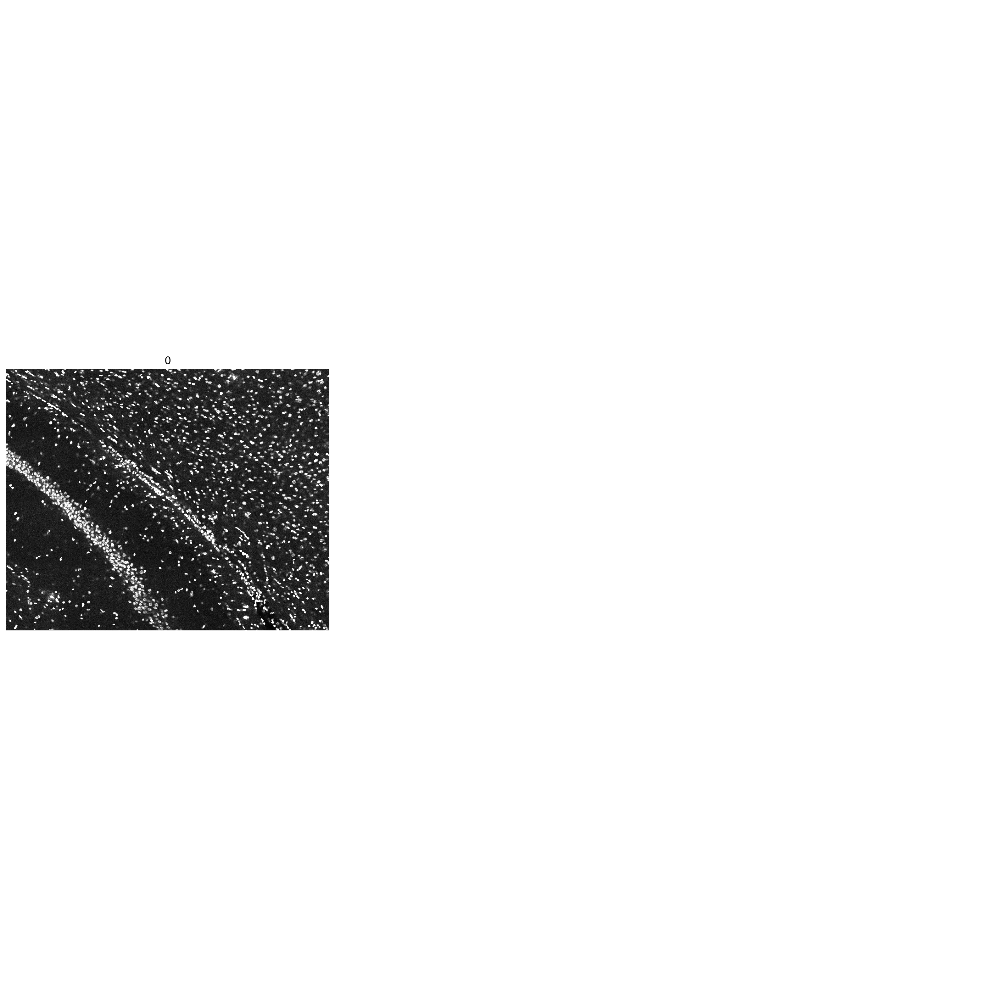

In [7]:
#Running
S = sorted(glob('data/ctx_dapi/test/images/*0512.tif'))# file name needed
print(S)
X = list(map(imread,S))

n_channel = 1 if X[0].ndim == 3 else X[0].shape[-1]
axis_norm = (0,1,2)   # normalize channels independently
# axis_norm = (0,1,2,3) # normalize channels jointly
if n_channel > 1:
    print("Normalizing image channels %s." % ('jointly' if axis_norm is None or 2 in axis_norm else 'independently'))

# show all test images
if True:
    fig, ax = plt.subplots(1,3, figsize=(16,16))
    for i,(a,x) in enumerate(zip(ax.flat, X)):
        a.imshow(x[x.shape[0]//2],cmap='gray')
        a.set_title(i)
    [a.axis('off') for a in ax.flat]
    plt.tight_layout()
None;

## Prediction

Make sure to normalize the input image beforehand or supply a `normalizer` to the prediction function.

Calling `model.predict_instances` will
- predict object probabilities and star-convex polygon distances (see `model.predict` if you want those)
- perform non-maximum suppression (with overlap threshold `nms_thresh`) for polygons above object probability threshold `prob_thresh`.
- render all remaining polygon instances in a label image
- return the label instances image and also the details (coordinates, etc.) of all remaining polygons

# Image devide

In [8]:
#Running
import skimage.io as io
root='./data/ctx_dapi/test/result/'

model = StarDist3D(None, name='stardist', basedir='models')

def get_nonzero(image):
    element=[]
    for i in range(image.max()):
        if i+1 in image:
            if not i+1 in element:
                element.append(i+1)
                print(i+1)
    return element

def aera_counting(sx,sy,aera1,aera2,left,right):
    if sx<0 or sy<0 or sx>=aera1.shape[0] or sy>=aera1.shape[1]:
        return 0
    elif aera1[sx,sy]!=left or aera2[sx,sy]!=right:
        return 0
    else:
        return 1+aera_counting(sx+1,sy,aera1,aera2,left,right)+aera_counting(sx,sy+1,aera1,aera2,left,right)+aera_counting(sx-1,sy,aera1,aera2,left,right)+aera_counting(sx,sy-1,aera1,aera2,left,right)

def reconstract(image1,image2,dim,thershold=1):
    if not image1.any():
        return image2
    elif not image2.any():
        return image1
    else:
        temp=[0,2,1]
        white_list=[]
        
        for y in range(image1.shape[0]):
            for x in range(image1.shape[temp[dim]]):
                if dim==1:
                    if image1[y,image1.shape[1]-1,x]==0 or image2[y,0,x]==0 or image1[y,image1.shape[1]-1,x]==image2[y,0,x] or image2[y,0,x] in white_list:
                        continue
                    else:
                        #continue
                        count=np.count_nonzero(image2[:,0,:]==image2[y,0,x])
                        if count>thershold:
                            image2[image2==image2[y,0,x]]=image1[y,image1.shape[1]-1,x]
                        else:
                            white_list.append(image2[y,0,x])

                elif dim ==2:
                    if image1[y,x,image1.shape[2]-1]==0 or image2[y,x,0]==0 or image1[y,x,image1.shape[2]-1]==image2[y,x,0] or image2[y,x,0] in white_list:
                        continue
                    else:
                        #continue
                        count=np.count_nonzero(image2[:,:,0]==image2[y,x,0])
                        if count>thershold:
                            image2[image2==image2[y,x,0]]=image1[y,x,image1.shape[2]-1]
                        else:
                            white_list.append(image2[y,x,0])
        
        return np.concatenate((image1,image2),axis=dim)

def force_recon(image1,image2,dim):
    if not image1.any():
        return image2
    elif not image2.any():
        return image1
    else:
        return np.concatenate((image1,image2),axis=dim)

Loading network weights from 'weights_best.h5'.
Loading thresholds from 'thresholds.json'.
Using default values: prob_thresh=0.52949, nms_thresh=0.3.


In [4]:
#for kernel crash

temp=io.imread('temp.tif')
sub_label=[]
dim=4
image=X[0]
img=normalize(image, 1,99.8, axis=axis_norm)
dx=512
dy=512
for i in range(dim*dim):
    sub_label.append(temp[:,int((i%dim)*dx):int((i%dim+1)*dx),int((i//dim)*dy):int((i//dim+1)*dy)])
cut=img[:,int((i%dim)*dx):int((i%dim+1)*dx),int((i//dim)*dy):int((i//dim+1)*dy)]
centroid=[]
for i in range(16):
    centroid.append(io.imread('cen_temp'+str(i)+'.tif'))


In [9]:
#Running
def divide_and_reconstract(model,image,dim=2,great_number=500):
    img=normalize(image, 1,99.8, axis=axis_norm)
    centroid=[]
    sub_label=[]
    dx=image.shape[1]//dim
    dy=image.shape[2]//dim
    for i in range(dim*dim):
        cut=img[:,int((i%dim)*dx):int((i%dim+1)*dx),int((i//dim)*dy):int((i//dim+1)*dy)]
        labels, details = model.predict_instances(cut)
        sub_label.append(labels)
        centroid.append(details['points'])

    for i in range(len(sub_label)):
        sub_label[i]=sub_label[i]+i*great_number
        sub_label[i][sub_label[i]==i*great_number]=0
        centroid[i]+=[0,int(dx*(i%dim)),int(dy*(i//dim))]

    full=np.array([])
    count=0
    for label in sub_label:
        if count%dim==0:
            if count != 0:
                full=reconstract(full,line,2)
            line=np.array([])
        line=reconstract(line,label,1)
        count+=1
    full=reconstract(full,line,2)
    #print(line.shape)

    #centroid combine
    combine=[]
    for i in range(len(centroid)):
        combine.append([])
        for j in range(len(centroid[i])):
            part=centroid[i][j]
            this_label=full[part[0],part[1],part[2]]
            if this_label<i*great_number:
                check=this_label//great_number
                centroid[check][this_label%great_number-1]+=part
                centroid[check][this_label%great_number-1]=centroid[check][this_label%great_number-1]/2
                centroid[check]=centroid[check].astype(np.int64)
                combine[i].append(j)
        
    for i in range(len(centroid)):
        centroid[i]=np.delete(centroid[i],combine[i],axis=0)


    plt.figure(figsize=(26,16))
    img_show = img
    z = cut.shape[0] // 2
    y = cut.shape[1] // 2
    plt.subplot(221); plt.imshow(img_show[z],   cmap='gray', clim=(0,1)); plt.axis('off'); plt.title('XY slice')
    plt.subplot(222); plt.imshow(img_show[:,y], cmap='gray', clim=(0,1)); plt.axis('off'); plt.title('XZ slice')
    plt.subplot(223); plt.imshow(img_show[z],   cmap='gray', clim=(0,1)); plt.axis('off'); plt.title('XY slice')
    plt.imshow(full[z], cmap=lbl_cmap, alpha=0.5)
    plt.subplot(224); plt.imshow(img_show[:,y], cmap='gray', clim=(0,1)); plt.axis('off'); plt.title('XZ slice')
    plt.imshow(full[:,y], cmap=lbl_cmap, alpha=0.5)
    plt.tight_layout()
    plt.show()
    return full,np.concatenate(centroid,axis=0)

In [5]:
def divide_and_reconstract_debug(model,image,dim=2,great_number=500):
    img=normalize(image, 1,99.8, axis=axis_norm)
    centroid=[]
    sub_label=[]
    dx=image.shape[1]//dim
    dy=image.shape[2]//dim
    for i in range(dim*dim):
        cut=img[:,int((i%dim)*dx):int((i%dim+1)*dx),int((i//dim)*dy):int((i//dim+1)*dy)]
        labels, details = model.predict_instances(cut)
        sub_label.append(labels)
        centroid.append(details['points'])

    for i in range(len(sub_label)):
        sub_label[i]=sub_label[i]+i*great_number
        sub_label[i][sub_label[i]==i*great_number]=0
        centroid[i]+=[0,int(dx*(i%dim)),int(dy*(i//dim))]

    full=np.array([])
    count=0
    for label in sub_label:
        if count%dim==0:
            if count != 0:
                full=reconstract(full,line,2)
            line=np.array([])
        line=reconstract(line,label,1)
        count+=1
    full=reconstract(full,line,2)
    print(line.shape)

    #centroid combine
    # combine=[]
    # for i in range(len(centroid)):
    #     combine.append([])
    #     for j in range(len(centroid[i])):
    #         part=centroid[i][j]
    #         this_label=full[part[0],part[1],part[2]]
    #         if this_label<i*great_number:
    #             check=this_label//great_number
    #             centroid[check][this_label%great_number-1]+=part
    #             centroid[check][this_label%great_number-1]=centroid[check][this_label%great_number-1]/2
    #             centroid[check]=centroid[check].astype(np.int64)
    #             combine[i].append(j)
        
    # for i in range(len(centroid)):
    #     centroid[i]=np.delete(centroid[i],combine[i],axis=0)


    plt.figure(figsize=(26,16))
    img_show = img
    z = cut.shape[0] // 2
    y = cut.shape[1] // 2
    plt.subplot(221); plt.imshow(img_show[z],   cmap='gray', clim=(0,1)); plt.axis('off'); plt.title('XY slice')
    plt.subplot(222); plt.imshow(img_show[:,y], cmap='gray', clim=(0,1)); plt.axis('off'); plt.title('XZ slice')
    plt.subplot(223); plt.imshow(img_show[z],   cmap='gray', clim=(0,1)); plt.axis('off'); plt.title('XY slice')
    plt.imshow(full[z], cmap=lbl_cmap, alpha=0.5)
    plt.subplot(224); plt.imshow(img_show[:,y], cmap='gray', clim=(0,1)); plt.axis('off'); plt.title('XZ slice')
    plt.imshow(full[:,y], cmap=lbl_cmap, alpha=0.5)
    plt.tight_layout()
    plt.show()
    return full,centroid

In [ ]:
l,c=divide_and_reconstract_debug(model,X[0],dim=4)
io.imsave('temp.tif',l)
for i in range(len(c)):
    io.imsave('cen_temp'+str(i)+'.tif',c[i])

In [11]:
import skimage
cen1=np.zeros(l.shape)
for i in c:
    print(i.shape)
    for j in i:
        cen1[j[0],j[1],j[2]]=65535

cen1 = skimage.morphology.dilation(cen1, skimage.morphology.ball(5))

In [ ]:
centroid=c.copy()
full=l.copy()
great_number=500
combine=[]
for i in range(len(centroid)):
    combine.append([])
    for j in range(len(centroid[i])):
        part=centroid[i][j]
        this_label=full[part[0],part[1],part[2]]
        if this_label<i*great_number:
            check=this_label//great_number
            print(i,check,part,this_label,this_label%great_number-1,centroid[check].shape)
            centroid[check][this_label%great_number-1]+=part
            centroid[check][this_label%great_number-1]=centroid[check][this_label%great_number-1]/2
            centroid[check]=centroid[check].astype(np.int64)
            combine[i].append(j)
    
for i in range(len(centroid)):
    centroid[i]=np.delete(centroid[i],combine[i],axis=0)

In [ ]:
#Running
import skimage
for i in range(len(X)):
    l,c=divide_and_reconstract(model,X[i],dim=8,great_number=1000)
    cen1=np.zeros(l.shape)
    root=S[i].replace('images','r4')#output dir needed
    print(root)
    root=root.replace('.tif','_predict.tif')
    print(root)
    l=l.astype(np.uint16)
    io.imsave(root,l)
    root_point=root.replace('tif','txt')
    with open(root_point, 'w') as f:
        for line in c:
            cen1[line[0],line[1],line[2]]=65535
            f.write(str(line[0])+','+str(line[1])+','+str(line[2])+'\n')

    cen1 = skimage.morphology.dilation(cen1, skimage.morphology.ball(5))
    cen1=cen1.astype(np.uint16)
    io.imsave(root.replace('predict','centroid'),cen1)

In [8]:
root=root.replace('.tif','_predict.tif')
l=l.astype(np.uint16)
io.imsave(root,l)
root_point=root.replace('tif','txt')
with open(root_point, 'w') as f:
    for line in c:
        cen1[line[0],line[1],line[2]]=65535
        f.write(str(line[0])+','+str(line[1])+','+str(line[2])+'\n')

cen1 = skimage.morphology.dilation(cen1, skimage.morphology.ball(5))
cen1=cen1.astype(np.uint16)
io.imsave(root.replace('predict','centroid'),cen1)

1484762330.py (12): data/ctx_dapi/test/r3\DAPI_tile_2048_centroid_centroid.tif is a low contrast image


In [16]:
path='./data/ctx_dapi/test/r2/'
paths = sorted(glob(path+'*.tif'))

for i in paths:
    img=io.imread(i)
    img=img.astype(np.uint16)
    io.imsave(i.replace('.tif','_2.tif'),img)


2024719444.py (7): ./data/ctx_dapi/test/r2\HP_CA3_100um_DAPI_predict_2.tif is a low contrast image
2024719444.py (7): ./data/ctx_dapi/test/r2\HT_100um_DAPI_predict_2.tif is a low contrast image
2024719444.py (7): ./data/ctx_dapi/test/r2\TH_100um_DAPI_predict_2.tif is a low contrast image
2024719444.py (7): ./data/ctx_dapi/test/r2\Where_100um_DAPI_predict_2.tif is a low contrast image


In [ ]:
for i in range(len(X)):
    l,c=divide_and_reconstract(model,X[i])

In [47]:
dim=2
image=X[0]
img=normalize(image, 1,99.8, axis=axis_norm)
label_full=np.zeros(image.shape)
centroid=[]
sub_label=[]
dx=image.shape[1]//dim
dy=image.shape[2]//dim
for i in range(dim*dim):
    cut=img[:,int((i%dim)*dx):int((i%dim+1)*dx),int((i//dim)*dy):int((i//dim+1)*dy)]
    #print(cut.shape)
    #print(int((i//dim)*dy),int((i//dim+1)*dy))
    #'''
    labels, details = model.predict_instances(cut)
    sub_label.append(labels)
    centroid.append(details['points'])



1/1 [==============================] - 0s 148ms/step


In [19]:
great_number=500
for i in range(len(sub_label)):
    sub_label[i]=sub_label[i]+i*great_number
    sub_label[i][sub_label[i]==i*great_number]=0
    centroid[i]+=[0,int(dx*(i%dim)),int(dy*(i//dim))]

In [16]:
backup=centroid.copy()
for i in range(4):
    io.imsave('cen_temp'+str(i)+'.tif',backup[i])

1886674648.py (3): cen_temp0.tif is a low contrast image
1886674648.py (3): cen_temp1.tif is a low contrast image
1886674648.py (3): cen_temp2.tif is a low contrast image
1886674648.py (3): cen_temp3.tif is a low contrast image


In [ ]:
#force
full=np.array([])
count=0
for label in sub_label:
    if count%dim==0:
        if count != 0:
            full=force_recon(full,line,2)
        line=np.array([])
    line=force_recon(line,label,1)
    count+=1
full=force_recon(full,line,2)
print(full.shape)
    


plt.figure(figsize=(26,16))
img_show = img
z = cut.shape[0] // 2
y = cut.shape[1] // 2
plt.subplot(221); plt.imshow(img_show[z],   cmap='gray', clim=(0,1)); plt.axis('off'); plt.title('XY slice')
plt.subplot(222); plt.imshow(img_show[:,y], cmap='gray', clim=(0,1)); plt.axis('off'); plt.title('XZ slice')
plt.subplot(223); plt.imshow(img_show[z],   cmap='gray', clim=(0,1)); plt.axis('off'); plt.title('XY slice')
plt.imshow(full[z], cmap=lbl_cmap, alpha=0.5)
plt.subplot(224); plt.imshow(img_show[:,y], cmap='gray', clim=(0,1)); plt.axis('off'); plt.title('XZ slice')
plt.imshow(full[:,y], cmap=lbl_cmap, alpha=0.5)
plt.tight_layout()
plt.show()

io.imsave('temp.tif',full)

In [46]:
a=np.array([[3,4,5],[6,7,8]])
b=[a,a,a]
print(a[1])
a[1]=a[1]/2
print(a[1])
print(b)
print(centroid[0][10])
print(centroid[0][10]/2)

[6 7 8]
[3 3 4]
[array([[3, 4, 5],
       [3, 3, 4]]), array([[3, 4, 5],
       [3, 3, 4]]), array([[3, 4, 5],
       [3, 3, 4]])]
[102 188 296]
[ 51.  94. 148.]


(187, 512, 512)
(187, 1024, 512)
(187, 512, 512)
(187, 1024, 512)
(187, 1024, 1024)


2023011592.py (14): full_temp.tif is a low contrast image
2023011592.py (23): cen1.tif is a low contrast image


175 1 50
0 237
[124 526 372] [121 506 368]
### [122 516 370]
210 1 54
0 237
[135 528 264] [135 506 252]
### [135 517 258]
136 1 66
0 237
[108 522 296] [105 502 284]
### [106 512 290]
187 1 104
0 237
[146 526 160] [144 506 158]
### [145 516 159]
90 1 118
0 237
[ 80 516 348] [ 78 500 346]
### [ 79 508 347]
188 1 136
0 237
[173 516 408] [173 506 408]
### [173 511 408]
150 1 155
0 237
[110 516 500] [108 500 496]
### [109 508 498]
71 1 163
0 237
[ 94 516 466] [ 88 492 464]
### [ 91 504 465]
166 1 165
0 237
[166 516 328] [166 498 320]
### [166 507 324]
188 1 176
0 237
[163 520 416] [173 511 408]
### [168 515 412]
209 1 188
0 237
[115 516  84] [116 502  84]
### [115 509  84]
220 2 71
0 237
[ 52 394 530] [ 55 396 506]
### [ 53 395 518]
227 2 89
0 237
[ 87 470 532] [ 86 468 506]
### [ 86 469 519]
215 2 99
0 237
[ 79 196 532] [ 76 176 506]
### [ 77 186 519]
163 2 127
0 237
[ 33 352 518] [ 35 352 504]
### [ 34 352 511]
212 2 129
0 237
[ 90  52 532] [ 91  52 506]
### [ 90  52 519]
106 2 149
0 237


2023011592.py (51): cen2.tif is a low contrast image


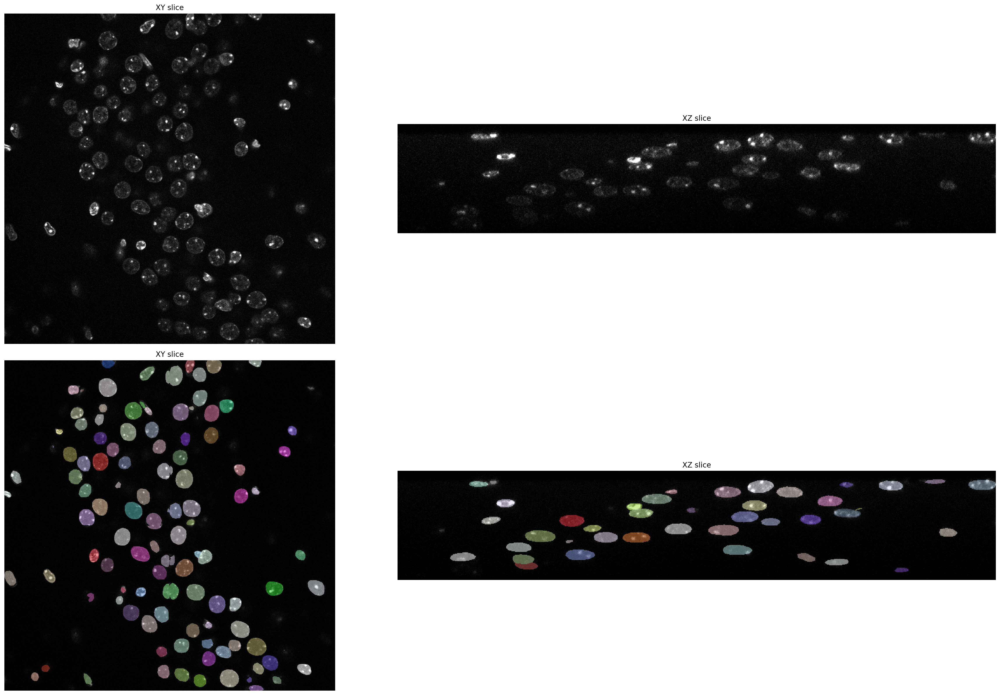

In [22]:
import skimage
full=np.array([])
count=0
for label in sub_label:
    if count%dim==0:
        if count != 0:
            full=reconstract(full,line,2)
        line=np.array([])
    line=reconstract(line,label,1)
    print(line.shape)
    count+=1
full=reconstract(full,line,2)
print(full.shape)
io.imsave('full_temp.tif',full)
cen1=np.zeros(full.shape)
cen2=np.zeros(full.shape)

for  a in centroid:
    for b in a:
        cen1[b[0],b[1],b[2]]=65535
kernel = skimage.morphology.ball(5)
cen1 = skimage.morphology.dilation(cen1, kernel)
io.imsave('cen1.tif',cen1)

#centroid combine
combine=[]
for i in range(len(centroid)):
    combine.append([])
    for j in range(len(centroid[i])):
        part=centroid[i][j]
        this_label=full[part[0],part[1],part[2]]
        if this_label<i*great_number:
            print(this_label,i,j)
            check=this_label//great_number
            print(check,len(centroid[check]))
            print(part,centroid[check][this_label%great_number-1])
            centroid[check][this_label%great_number-1]+=part
            centroid[check][this_label%great_number-1]=centroid[check][this_label%great_number-1]/2
            print('###',centroid[check][this_label%great_number-1])
            centroid[check]=centroid[check].astype(np.int64)
            combine[i].append(j)
    
for i in range(len(centroid)):
    centroid[i]=np.delete(centroid[i],combine[i],axis=0)

for  a in centroid:
    for b in a:
        cen2[b[0],b[1],b[2]]=65535
kernel = skimage.morphology.ball(5)
cen2 = skimage.morphology.dilation(cen2, kernel)
io.imsave('cen2.tif',cen2)



plt.figure(figsize=(26,16))
img_show = img
z = cut.shape[0] // 2
y = cut.shape[1] // 2
plt.subplot(221); plt.imshow(img_show[z],   cmap='gray', clim=(0,1)); plt.axis('off'); plt.title('XY slice')
plt.subplot(222); plt.imshow(img_show[:,y], cmap='gray', clim=(0,1)); plt.axis('off'); plt.title('XZ slice')
plt.subplot(223); plt.imshow(img_show[z],   cmap='gray', clim=(0,1)); plt.axis('off'); plt.title('XY slice')
plt.imshow(full[z], cmap=lbl_cmap, alpha=0.5)
plt.subplot(224); plt.imshow(img_show[:,y], cmap='gray', clim=(0,1)); plt.axis('off'); plt.title('XZ slice')
plt.imshow(full[:,y], cmap=lbl_cmap, alpha=0.5)
plt.tight_layout()
plt.show()

(187, 1024, 1024)


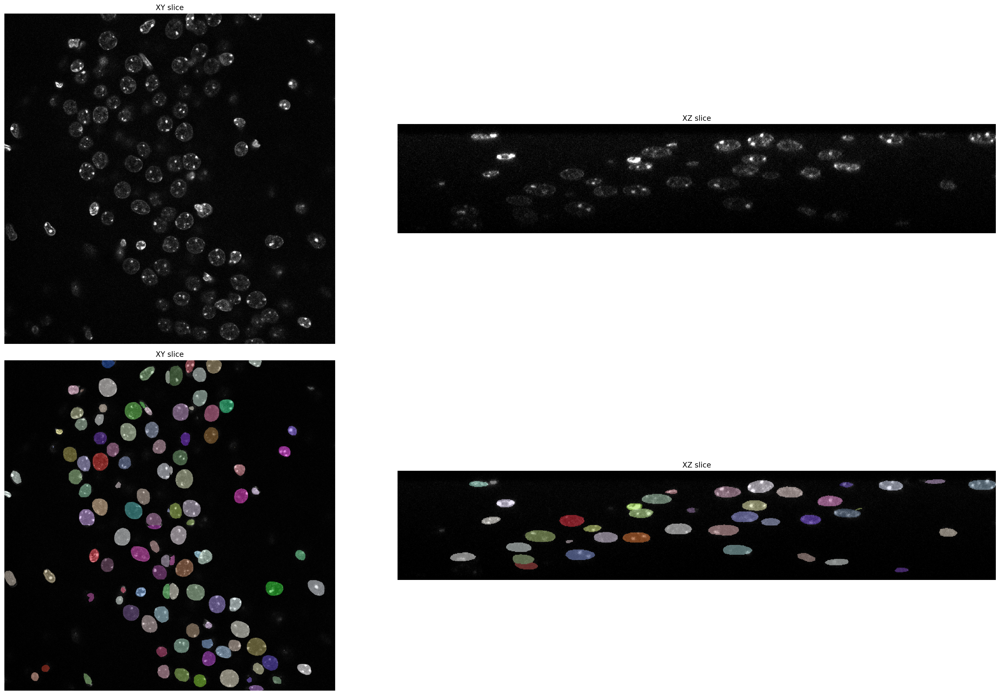

In [14]:
full=np.array([])
count=0
for label in sub_label:
    if count%dim==0:
        if count != 0:
            full=force_recon(full,line,2)
        line=np.array([])
    line=force_recon(line,label,1)
    count+=1
full=force_recon(full,line,2)
print(full.shape)
    


plt.figure(figsize=(26,16))
img_show = img
z = cut.shape[0] // 2
y = cut.shape[1] // 2
plt.subplot(221); plt.imshow(img_show[z],   cmap='gray', clim=(0,1)); plt.axis('off'); plt.title('XY slice')
plt.subplot(222); plt.imshow(img_show[:,y], cmap='gray', clim=(0,1)); plt.axis('off'); plt.title('XZ slice')
plt.subplot(223); plt.imshow(img_show[z],   cmap='gray', clim=(0,1)); plt.axis('off'); plt.title('XY slice')
plt.imshow(full[z], cmap=lbl_cmap, alpha=0.5)
plt.subplot(224); plt.imshow(img_show[:,y], cmap='gray', clim=(0,1)); plt.axis('off'); plt.title('XZ slice')
plt.imshow(full[:,y], cmap=lbl_cmap, alpha=0.5)
plt.tight_layout()
plt.show()

In [8]:
aa,bb = divide_and_reconstract(model,X[0])

1/1 [==============================] - 0s 166ms/step


869566592.py (5): The truth value of an empty array is ambiguous. Returning False, but in future this will result in an error. Use `array.size > 0` to check that an array is not empty.


(187, 512, 512)


ValueError: The truth value of an array with more than one element is ambiguous. Use a.any() or a.all()

In [ ]:
img = normalize(X[2], 1,99.8, axis=axis_norm)
labels, details = model.predict_instances(img)

ResourceExhaustedError: Graph execution error:

Detected at node 'model/conv3d/Conv3D' defined at (most recent call last):
    File "e:\anaconda3\envs\star2\lib\runpy.py", line 197, in _run_module_as_main
      return _run_code(code, main_globals, None,
    File "e:\anaconda3\envs\star2\lib\runpy.py", line 87, in _run_code
      exec(code, run_globals)
    File "e:\anaconda3\envs\star2\lib\site-packages\ipykernel_launcher.py", line 17, in <module>
      app.launch_new_instance()
    File "e:\anaconda3\envs\star2\lib\site-packages\traitlets\config\application.py", line 992, in launch_instance
      app.start()
    File "e:\anaconda3\envs\star2\lib\site-packages\ipykernel\kernelapp.py", line 711, in start
      self.io_loop.start()
    File "e:\anaconda3\envs\star2\lib\site-packages\tornado\platform\asyncio.py", line 215, in start
      self.asyncio_loop.run_forever()
    File "e:\anaconda3\envs\star2\lib\asyncio\base_events.py", line 601, in run_forever
      self._run_once()
    File "e:\anaconda3\envs\star2\lib\asyncio\base_events.py", line 1905, in _run_once
      handle._run()
    File "e:\anaconda3\envs\star2\lib\asyncio\events.py", line 80, in _run
      self._context.run(self._callback, *self._args)
    File "e:\anaconda3\envs\star2\lib\site-packages\ipykernel\kernelbase.py", line 510, in dispatch_queue
      await self.process_one()
    File "e:\anaconda3\envs\star2\lib\site-packages\ipykernel\kernelbase.py", line 499, in process_one
      await dispatch(*args)
    File "e:\anaconda3\envs\star2\lib\site-packages\ipykernel\kernelbase.py", line 406, in dispatch_shell
      await result
    File "e:\anaconda3\envs\star2\lib\site-packages\ipykernel\kernelbase.py", line 729, in execute_request
      reply_content = await reply_content
    File "e:\anaconda3\envs\star2\lib\site-packages\ipykernel\ipkernel.py", line 411, in do_execute
      res = shell.run_cell(
    File "e:\anaconda3\envs\star2\lib\site-packages\ipykernel\zmqshell.py", line 531, in run_cell
      return super().run_cell(*args, **kwargs)
    File "e:\anaconda3\envs\star2\lib\site-packages\IPython\core\interactiveshell.py", line 2961, in run_cell
      result = self._run_cell(
    File "e:\anaconda3\envs\star2\lib\site-packages\IPython\core\interactiveshell.py", line 3016, in _run_cell
      result = runner(coro)
    File "e:\anaconda3\envs\star2\lib\site-packages\IPython\core\async_helpers.py", line 129, in _pseudo_sync_runner
      coro.send(None)
    File "e:\anaconda3\envs\star2\lib\site-packages\IPython\core\interactiveshell.py", line 3221, in run_cell_async
      has_raised = await self.run_ast_nodes(code_ast.body, cell_name,
    File "e:\anaconda3\envs\star2\lib\site-packages\IPython\core\interactiveshell.py", line 3400, in run_ast_nodes
      if await self.run_code(code, result, async_=asy):
    File "e:\anaconda3\envs\star2\lib\site-packages\IPython\core\interactiveshell.py", line 3460, in run_code
      exec(code_obj, self.user_global_ns, self.user_ns)
    File "C:\Users\PC\AppData\Local\Temp\ipykernel_6500\221225295.py", line 2, in <module>
      labels, details = model.predict_instances(img)
    File "e:\anaconda3\envs\star2\lib\site-packages\stardist\models\base.py", line 775, in predict_instances
      for r in self._predict_instances_generator(*args, **kwargs):
    File "e:\anaconda3\envs\star2\lib\site-packages\stardist\models\base.py", line 727, in _predict_instances_generator
      for res in self._predict_sparse_generator(img, axes=axes, normalizer=normalizer, n_tiles=n_tiles,
    File "e:\anaconda3\envs\star2\lib\site-packages\stardist\models\base.py", line 590, in _predict_sparse_generator
      results = predict_direct(x)
    File "e:\anaconda3\envs\star2\lib\site-packages\stardist\models\base.py", line 398, in predict_direct
      ys = self.keras_model.predict(x[np.newaxis], **predict_kwargs)
    File "e:\anaconda3\envs\star2\lib\site-packages\keras\utils\traceback_utils.py", line 65, in error_handler
      return fn(*args, **kwargs)
    File "e:\anaconda3\envs\star2\lib\site-packages\keras\engine\training.py", line 2253, in predict
      tmp_batch_outputs = self.predict_function(iterator)
    File "e:\anaconda3\envs\star2\lib\site-packages\keras\engine\training.py", line 2041, in predict_function
      return step_function(self, iterator)
    File "e:\anaconda3\envs\star2\lib\site-packages\keras\engine\training.py", line 2027, in step_function
      outputs = model.distribute_strategy.run(run_step, args=(data,))
    File "e:\anaconda3\envs\star2\lib\site-packages\keras\engine\training.py", line 2015, in run_step
      outputs = model.predict_step(data)
    File "e:\anaconda3\envs\star2\lib\site-packages\keras\engine\training.py", line 1983, in predict_step
      return self(x, training=False)
    File "e:\anaconda3\envs\star2\lib\site-packages\keras\utils\traceback_utils.py", line 65, in error_handler
      return fn(*args, **kwargs)
    File "e:\anaconda3\envs\star2\lib\site-packages\keras\engine\training.py", line 557, in __call__
      return super().__call__(*args, **kwargs)
    File "e:\anaconda3\envs\star2\lib\site-packages\keras\utils\traceback_utils.py", line 65, in error_handler
      return fn(*args, **kwargs)
    File "e:\anaconda3\envs\star2\lib\site-packages\keras\engine\base_layer.py", line 1097, in __call__
      outputs = call_fn(inputs, *args, **kwargs)
    File "e:\anaconda3\envs\star2\lib\site-packages\keras\utils\traceback_utils.py", line 96, in error_handler
      return fn(*args, **kwargs)
    File "e:\anaconda3\envs\star2\lib\site-packages\keras\engine\functional.py", line 510, in call
      return self._run_internal_graph(inputs, training=training, mask=mask)
    File "e:\anaconda3\envs\star2\lib\site-packages\keras\engine\functional.py", line 667, in _run_internal_graph
      outputs = node.layer(*args, **kwargs)
    File "e:\anaconda3\envs\star2\lib\site-packages\keras\utils\traceback_utils.py", line 65, in error_handler
      return fn(*args, **kwargs)
    File "e:\anaconda3\envs\star2\lib\site-packages\keras\engine\base_layer.py", line 1097, in __call__
      outputs = call_fn(inputs, *args, **kwargs)
    File "e:\anaconda3\envs\star2\lib\site-packages\keras\utils\traceback_utils.py", line 96, in error_handler
      return fn(*args, **kwargs)
    File "e:\anaconda3\envs\star2\lib\site-packages\keras\layers\convolutional\base_conv.py", line 283, in call
      outputs = self.convolution_op(inputs, self.kernel)
    File "e:\anaconda3\envs\star2\lib\site-packages\keras\layers\convolutional\base_conv.py", line 255, in convolution_op
      return tf.nn.convolution(
Node: 'model/conv3d/Conv3D'
OOM when allocating tensor with shape[1,188,1024,1024,32] and type float on /job:localhost/replica:0/task:0/device:GPU:0 by allocator GPU_0_bfc
	 [[{{node model/conv3d/Conv3D}}]]
Hint: If you want to see a list of allocated tensors when OOM happens, add report_tensor_allocations_upon_oom to RunOptions for current allocation info. This isn't available when running in Eager mode.
 [Op:__inference_predict_function_1632]

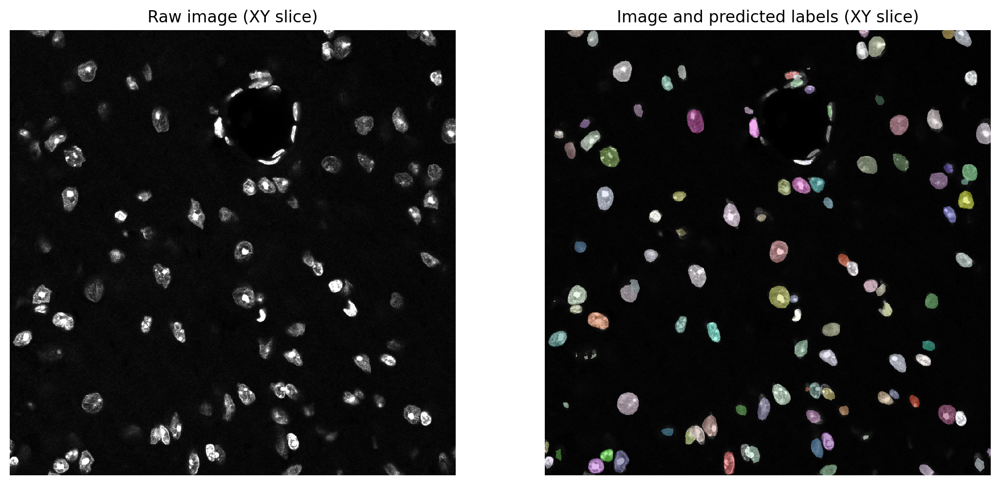

In [ ]:
plt.figure(figsize=(13,10))
z = max(0, img.shape[0] // 2 - 5)
plt.subplot(121)
plt.imshow((img if img.ndim==3 else img[...,:3])[z], clim=(0,1), cmap='gray')
plt.title('Raw image (XY slice)')
plt.axis('off')
plt.subplot(122)
plt.imshow((img if img.ndim==3 else img[...,:3])[z], clim=(0,1), cmap='gray')
plt.imshow(labels[z], cmap=lbl_cmap, alpha=0.5)
plt.title('Image and predicted labels (XY slice)')
plt.axis('off');

## Save predictions

Uncomment the lines in the following cell if you want to save the example image and the predicted label image to disk.

In [ ]:
# save_tiff_imagej_compatible('example_image.tif', img, axes='ZYX')
# save_tiff_imagej_compatible('example_labels.tif', labels, axes='ZYX')

# Example results

In [ ]:
for i in range(len(X)):
    example(model,i)

: 

: 

In [ ]:
#example(model, 0)

In [ ]:
#example(model, 1)

In [ ]:
#example(model, 2)